In [1]:
import numpy as np
import pandas as pd



import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import *
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import *
from sklearn.model_selection import train_test_split
from sklearn.tree import plot_tree
from sklearn import tree
sns.set_palette('Set2')
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import plot_confusion_matrix
from sklearn.linear_model import SGDRegressor

#### Load data...

In [2]:
train = pd.read_csv('C:/Users/خالد/Desktop/Python File/Coding Dojo/ML/CH_13/Assaignment data/train.csv')
test = pd.read_csv('C:/Users/خالد/Desktop/Python File/Coding Dojo/ML/CH_13/Assaignment data/test.csv')
sample_submission = pd.read_csv('C:/Users/خالد/Desktop/Python File/Coding Dojo/ML/CH_13/Assaignment data/sample_submission.csv')

### Look at data...

In [3]:
train.tail()

,id,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,...,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,target
299995,499993,A,B,A,C,B,B,A,E,E,...,0.269578,0.258655,0.363598,0.300619,0.340516,0.235711,0.383477,0.215227,0.793630,8.343538
299996,499996,A,B,A,C,B,B,A,E,E,...,0.197211,0.257024,0.574304,0.227035,0.322583,0.286094,0.324874,0.306933,0.230902,7.851861
299997,499997,A,B,A,C,B,B,A,E,C,...,0.449482,0.386172,0.476217,0.135947,0.502730,0.235788,0.316671,0.250286,0.349041,7.600558
299998,499998,A,B,B,C,B,B,A,D,E,...,0.363130,0.324132,0.229017,0.220888,0.515304,0.389391,0.245234,0.303895,0.481138,8.272095
299999,499999,A,A,B,A,B,D,A,E,C,...,0.734712,0.404145,0.497719,0.497974,0.782585,0.751251,0.608412,0.712868,0.452400,6.025685


In [4]:
test.tail()

,id,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,...,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13
199995,499987,A,A,A,C,B,D,A,E,G,...,0.277365,0.963678,0.240482,0.686462,0.915165,0.848878,0.459598,0.590327,0.864873,0.425258
199996,499990,A,A,A,C,B,D,A,E,E,...,0.523174,0.232072,0.363421,0.694092,0.137002,0.319465,0.364527,0.388908,0.664357,0.224215
199997,499991,A,A,A,C,B,D,A,E,C,...,0.517103,0.432927,0.811876,0.328398,0.496017,0.538779,0.466338,0.643869,0.749590,0.457702
199998,499994,A,B,A,A,B,D,A,E,C,...,0.279153,0.837712,0.680886,0.534439,0.501588,0.809053,0.631704,0.766426,0.937139,0.796304
199999,499995,A,B,A,C,B,C,A,E,G,...,0.763246,0.792263,0.409425,0.285033,0.594721,0.824892,0.479586,0.683065,0.721518,0.722690


In [5]:
sample_submission.tail()

,id,target
199995,499987,0.5
199996,499990,0.5
199997,499991,0.5
199998,499994,0.5
199999,499995,0.5


In [6]:
len(sample_submission),len(test)

(200000, 200000)

# Do your stuff...

### Deleverables
- EDA
    - What's going on?
    - Show me the data...
    - Bonus: Other / Etc...
- Model
    - [RandomForestRegressor()](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html)
    - Bonus: [KNeighborsRegressor()](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsRegressor.html)
    - Bonus: Other / Etc...
- Evaluation
    - mean_squared_error()
    - Bonus: [roc_auc_score()](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html)
    - Bonus: Other / Etc...
- RAPIDS Bonus
    - Apply RAPIDS ([Starter Notebook](https://www.kaggle.com/tunguz/tps-feb-2021-rapids-starter))
    - Replace pandas with cuDF & sklearn with cuDF & cuML

In [7]:
# good luck, have fun!

## EDA

### Exploring Data

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 26 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id      300000 non-null  int64  
 1   cat0    300000 non-null  object 
 2   cat1    300000 non-null  object 
 3   cat2    300000 non-null  object 
 4   cat3    300000 non-null  object 
 5   cat4    300000 non-null  object 
 6   cat5    300000 non-null  object 
 7   cat6    300000 non-null  object 
 8   cat7    300000 non-null  object 
 9   cat8    300000 non-null  object 
 10  cat9    300000 non-null  object 
 11  cont0   300000 non-null  float64
 12  cont1   300000 non-null  float64
 13  cont2   300000 non-null  float64
 14  cont3   300000 non-null  float64
 15  cont4   300000 non-null  float64
 16  cont5   300000 non-null  float64
 17  cont6   300000 non-null  float64
 18  cont7   300000 non-null  float64
 19  cont8   300000 non-null  float64
 20  cont9   300000 non-null  float64
 21  cont10  30

In [9]:
train.shape

(300000, 26)

In [10]:
train.describe()

,id,cont0,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,target
count,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000
mean,250018.576947,0.524634,0.506649,0.444115,0.446214,0.455471,0.508337,0.478345,0.455904,0.459321,0.526899,0.504943,0.529938,0.524549,0.503349,7.456260
std,144450.150010,0.204875,0.235269,0.200089,0.238669,0.200695,0.231612,0.192432,0.204493,0.220642,0.204025,0.201549,0.230860,0.220892,0.225218,0.887295
min,1.000000,-0.093505,-0.055105,-0.060274,0.134760,0.189216,-0.087247,0.043953,0.208703,0.004041,0.073040,0.059644,0.064161,-0.005600,0.158121,0.000000
25%,124772.500000,0.370451,0.352307,0.314121,0.214572,0.279853,0.338747,0.339896,0.278041,0.308655,0.361957,0.338898,0.316662,0.332143,0.291289,6.798341
50%,250002.500000,0.492208,0.615156,0.457271,0.377823,0.411351,0.441384,0.410090,0.360736,0.425801,0.488867,0.519855,0.558827,0.407365,0.433909,7.496503
75%,375226.500000,0.654793,0.688150,0.554835,0.719758,0.621808,0.709515,0.604246,0.639388,0.541525,0.752765,0.672809,0.720381,0.732431,0.730870,8.161166
max,499999.000000,1.052666,0.851746,1.017689,1.006469,0.994050,1.044433,1.093312,1.036541,1.014156,0.972091,1.029773,1.038049,0.961370,0.873579,10.309208


In [11]:
train.describe(exclude='number')

,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9
count,300000,300000,300000,300000,300000,300000,300000,300000,300000,300000
unique,2,2,2,4,4,4,8,8,7,15
top,A,A,A,C,B,B,A,E,C,F
freq,281471,162678,276551,183752,297373,149208,292643,267631,121054,107281


#### Null Values

In [12]:
train.isnull().sum()

id        0
cat0      0
cat1      0
cat2      0
cat3      0
cat4      0
cat5      0
cat6      0
cat7      0
cat8      0
cat9      0
cont0     0
cont1     0
cont2     0
cont3     0
cont4     0
cont5     0
cont6     0
cont7     0
cont8     0
cont9     0
cont10    0
cont11    0
cont12    0
cont13    0
target    0
dtype: int64

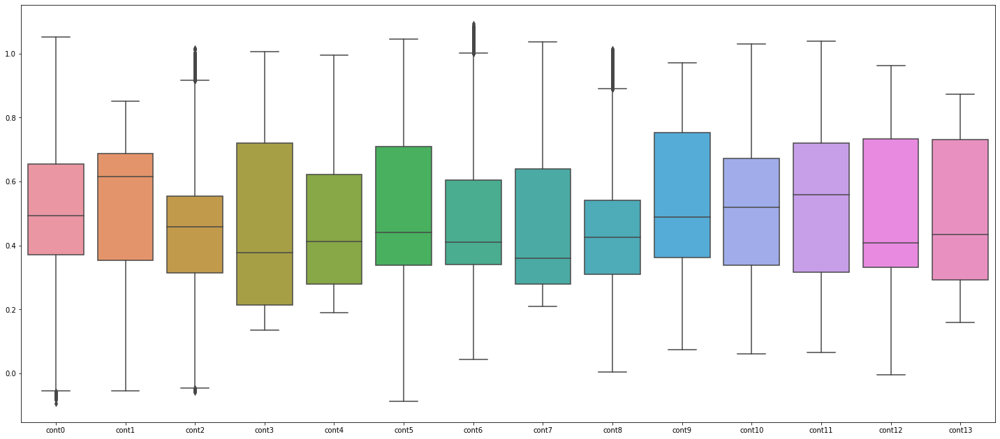

In [13]:
fig=plt.figure(figsize=(25,11))
col=['id','target']
sns.boxplot(data=train.drop(columns=col,axis=1))
plt.show()

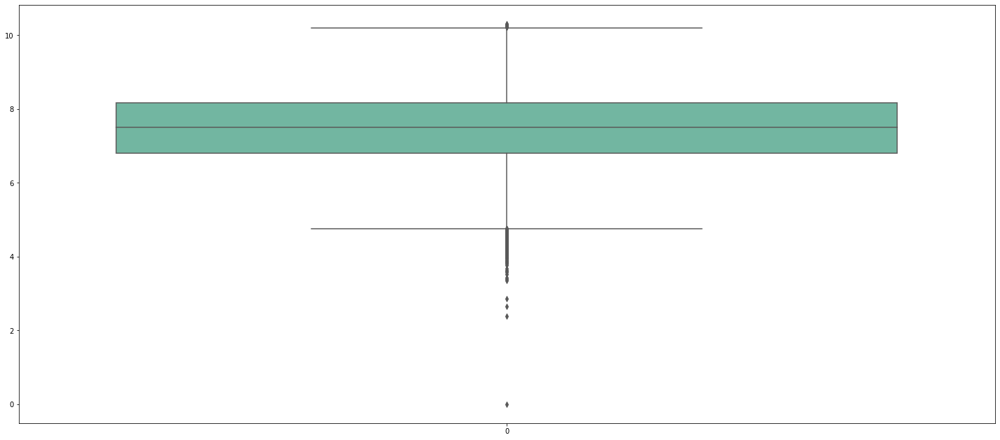

In [14]:
fig=plt.figure(figsize=(25,11))
sns.boxplot(data=train.target)
plt.show()

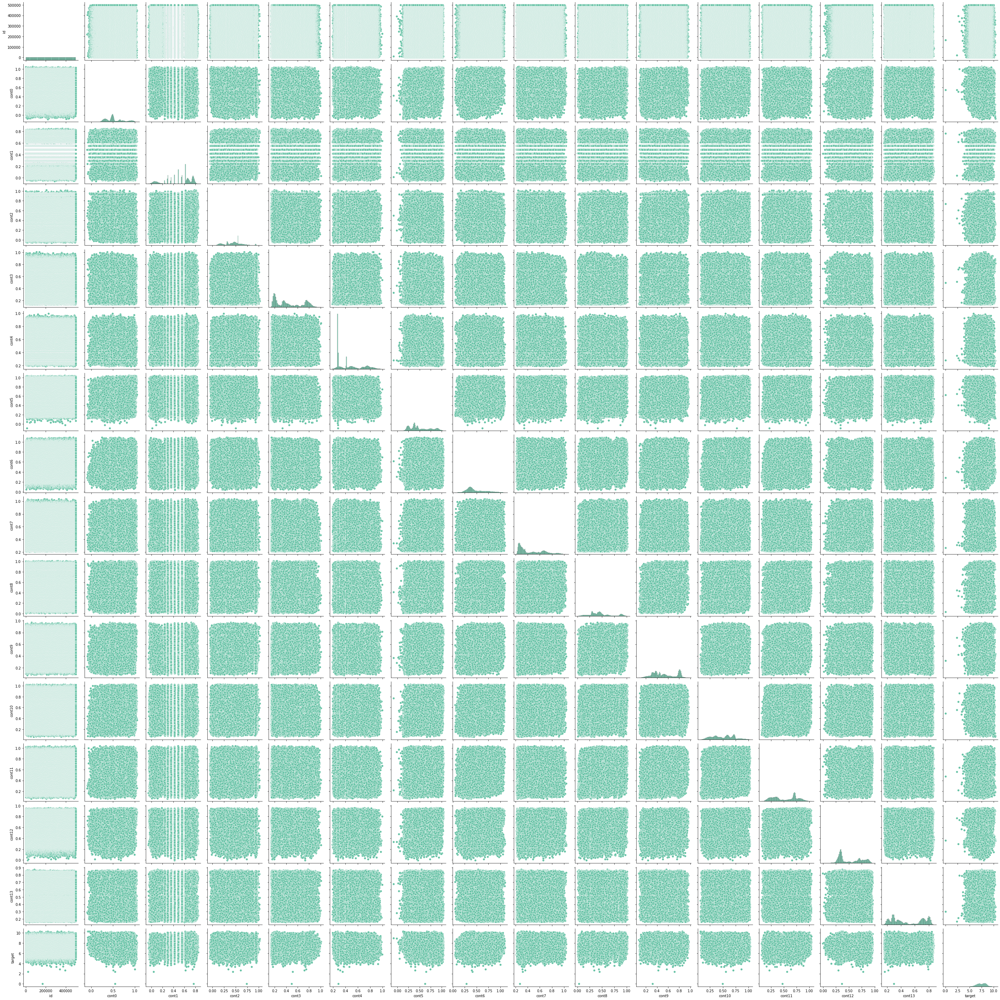

In [15]:
sns.pairplot(data=train)

In [16]:
corr=train.corr()
corr.style.background_gradient(cmap='coolwarm')


,id,cont0,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,target
id,1.000000,0.000221,0.002367,-0.000353,-0.000530,0.001846,-0.000544,0.001081,0.000381,-0.000858,-0.002219,-0.002606,-0.001952,-0.000695,-0.002619,0.000637
cont0,0.000221,1.000000,-0.122435,-0.268714,0.254450,-0.110564,0.575422,0.302765,0.301008,0.579133,0.524315,0.394608,0.425925,0.474031,0.040063,-0.039217
cont1,0.002367,-0.122435,1.000000,0.176182,-0.153708,-0.036118,-0.063597,0.097680,-0.092379,-0.105580,-0.036263,0.071484,0.059537,-0.080865,-0.033291,0.036767
cont2,-0.000353,-0.268714,0.176182,1.000000,-0.215764,0.048190,-0.292382,-0.050777,-0.214429,-0.276897,-0.228413,-0.071842,-0.106832,-0.329786,-0.054395,0.001806
cont3,-0.000530,0.254450,-0.153708,-0.215764,1.000000,-0.047835,0.252501,0.059500,0.214426,0.264950,0.219416,0.099317,0.131906,0.253377,0.042723,-0.005414
cont4,0.001846,-0.110564,-0.036118,0.048190,-0.047835,1.000000,-0.166930,-0.176369,-0.106053,-0.138045,-0.152713,-0.187616,-0.201191,-0.128014,-0.012573,-0.015908
cont5,-0.000544,0.575422,-0.063597,-0.292382,0.252501,-0.166930,1.000000,0.342678,0.341662,0.605475,0.615836,0.482362,0.509621,0.631926,0.030380,-0.025329
cont6,0.001081,0.302765,0.097680,-0.050777,0.059500,-0.176369,0.342678,1.000000,0.152232,0.307686,0.382399,0.456519,0.486724,0.246399,0.037930,0.015015
cont7,0.000381,0.301008,-0.092379,-0.214429,0.214426,-0.106053,0.341662,0.152232,1.000000,0.335029,0.285075,0.200825,0.228697,0.338485,0.050914,0.023479
cont8,-0.000858,0.579133,-0.105580,-0.276897,0.264950,-0.138045,0.605475,0.307686,0.335029,1.000000,0.558957,0.412967,0.458460,0.529932,0.046559,0.019246


## Cleaning

In [17]:
train=train[(train['cont0']>train['cont0'].quantile(.05))&
      (train['cont2']>train['cont2'].quantile(.05))&
      (train['cont2']<train['cont2'].quantile(.95))&
      (train['cont6']<train['cont6'].quantile(.95))&
      (train['cont8']<train['cont8'].quantile(.95))&     
      (train['target']<train['target'].quantile(.95))&
      (train['target']>train['target'].quantile(.05))]

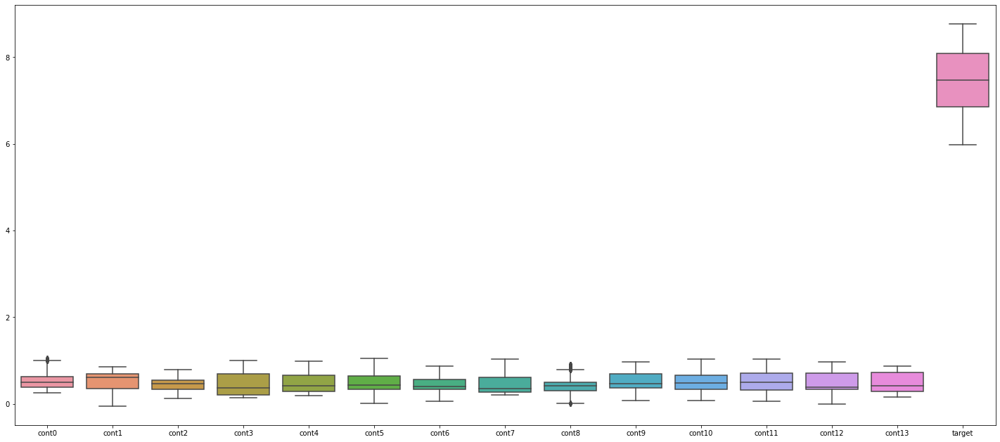

In [18]:
fig=plt.figure(figsize=(25,11))
col=['id']
sns.boxplot(data=train.drop(columns=col,axis=1))
plt.show()

In [19]:
train.shape

(207906, 26)

In [20]:
train=pd.get_dummies(data=train)
test=pd.get_dummies(data=test)

Splitting and training data

In [21]:
# Create Train
col=['cat6_G','target']
X_train = train.drop(col, axis=1)
y_train = train["target"]

# Create Test
X_test = test
y_test = sample_submission.target


Modeling


scaling

In [22]:
standrd = StandardScaler()
col=X_train.columns
X_train = standrd.fit_transform(X_train)
X_train

array([[-1.7318664 , -0.44610507, -2.14637726, ..., -0.18567871,
        -0.11864517, -0.14325768],
       [-1.73185255,  1.05290293,  1.10932497, ..., -0.18567871,
        -0.11864517, -0.14325768],
       [-1.7318387 , -0.17469673,  0.54055136, ..., -0.18567871,
        -0.11864517, -0.14325768],
       ...,
       [ 1.73072648, -0.97715537,  0.44822808, ...,  5.38564718,
        -0.11864517, -0.14325768],
       [ 1.73073341,  0.46039855,  0.74130087, ..., -0.18567871,
        -0.11864517, -0.14325768],
       [ 1.73074033, -0.23416078, -2.04560205, ..., -0.18567871,
        -0.11864517, -0.14325768]])

In [23]:
X_test=standrd.transform(X_test)

Random Forest Classification

In [24]:
rfr = RandomForestRegressor()

rfr.fit(X_train,y_train)


RandomForestRegressor()

In [25]:
rf_preds =rfr.predict(X_test)
rf_preds


array([7.50130133, 7.5795526 , 7.52217307, ..., 7.47032981, 7.45779721,
       7.42924497])

In [26]:
rf_mse = mean_squared_error(y_test , rf_preds)
print('Random Forest MSE Score = ' , rf_mse)


Random Forest MSE Score =  48.40141606539643


In [27]:
rf_mae=mean_absolute_error(y_test , rf_preds)
print('Random Forest MAE Score = ' , rf_mae)

Random Forest MAE Score =  6.955175551324622


In [28]:
rf_r2=r2_score(y_test , rf_preds)
print('Random Forest R2 Score = ' , rf_r2)


Random Forest R2 Score =  0.0


KNN

In [29]:
knn = KNeighborsRegressor(n_neighbors=5)

In [30]:
knn.fit(X_train, y_train)

KNeighborsRegressor()

In [ ]:
pred_knn = knn.predict(X_test)
pred_knn

In [ ]:
knn_mse=mean_squared_error(y_test , pred_knn)
print('KNN MSE Score = ' , knn_mse)

In [ ]:
knn_mae=mean_absolute_error(y_test , pred_knn)
print('KNN MAE Score = ' , knn_mae)

In [ ]:
knn_r2=r2_score(y_test , pred_knn)
print('KNN R2 Score = ' , knn_r2)


Linear Regression Model

In [ ]:
lir=LinearRegression()

In [ ]:
lir.fit(X_train, y_train)

In [ ]:
lir_preds=lir.predict(X_test)

In [ ]:
lir_mse = mean_squared_error(y_test, lir_preds)
print('Linear Regression MSE Score = ' , lir_mse)

SGDRegressor Model

In [ ]:
sgdr= SGDRegressor()

In [ ]:
sgdr.fit(X_train, y_train)

In [ ]:
sgdr_preds=sgdr.predict(X_test)

In [ ]:
sgdr_mse = mean_squared_error(y_test, sgdr_preds)
print('SGD Regression MSE Score = ' , sgdr_mse)

Using the grid to optimize the linear model since it is the best score untill now

In [ ]:
p_grid = {'fit_intercept': [True, False],
          'normalize': [True, False],}

grid = GridSearchCV(lir, p_grid,cv=10)

In [ ]:
grid.fit(X_train, y_train)

In [ ]:
best_score=grid.best_params_
best_score

In [ ]:
lir=LinearRegression(fit_intercept=best_score['fit_intercept'],normalize=best_score['normalize'])

In [ ]:
lir.fit(X_train, y_train)

In [ ]:
lir_preds=lir.predict(X_test)

In [ ]:
lir_acc = mean_squared_error(y_test, lir_preds)
print('Linear Regression MSE Score = ' , lir_acc)